# Model training with fixed Xeff

## Load data

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Input, Model


In [2]:
outdir = "out_positive_xeff"
# import data
data = pd.read_pickle(f"{outdir}/p_a1_positive_xeff.pkl")

In [3]:
data

,q,xeff,a1,p_a1
0,0.1,0.1,"[0.012024048096192383, 0.014003959823454523, 0...","[0.009216418726310445, 0.028458441503637077, 0..."
1,0.1,0.2,"[0.1222444889779559, 0.12400351805816039, 0.12...","[0.0013008215791223796, 0.004041149522956928, ..."
2,0.1,0.3,"[0.23246492985971942, 0.23400307629286626, 0.2...","[0.0010697856954987733, 0.0024382824268816272,..."
3,0.1,0.4,"[0.3426853707414829, 0.3440026345275721, 0.345...","[0.0009629691381983512, 0.00222891654232283, 0..."
4,0.1,0.5,"[0.45290581162324645, 0.454002192762278, 0.455...","[0.001315515963205737, 0.0027549382395791115, ..."
...,...,...,...,...
85,1.0,0.5,"[0.002004008016032064, 0.004003999983935807, 0...","[0.004842086019793161, 0.00951858515585301, 0...."
86,1.0,0.6,"[0.20240480961923846, 0.2040031967743101, 0.20...","[0.0010434286955042496, 0.0013208399318507351,..."
87,1.0,0.7,"[0.40280561122244485, 0.4040023935646844, 0.40...","[0.0018007422164230593, 0.0023384387900644075,..."
88,1.0,0.8,"[0.6032064128256512, 0.6040015903550587, 0.604...","[0.0032252396366210193, 0.004504994041532742, ..."


## Pre-processing

### Some data contains nans, drop them so that they wont cause problems later

In [4]:
# data.drop([0,1,2,3,4,5,6,7,8,9,10,11,21,22,32,33,43,44,54,55,65,66,76,77,87,88,98,99,109,110,120], inplace=True)
# data.reset_index(drop=True, inplace=True)

### Spliting data into train and test

In [5]:
# # a1
# a1 = []
# for i in range(len(data)):
#     a1.append(data['a1'][i])
# a1 = np.array(a1)
# # p
# p = []
# for i in range(len(data)):
#     p.append(data['p_a1'][i])
# p = np.array(p)
# # q
# q = []
# for i in data['q'].values:
#     for j in range(len(a1[0])):
#         q.append(i)
# q = np.array(q)
# # xeff 
# xeff = []
# for i in data['xeff'].values:
#     for j in range(len(a1[0])):
#         xeff.append(i)
# xeff = np.array(xeff)

# a1 = a1.flatten()
# p = p.flatten()

# print(xeff.shape, q.shape, p.shape, a1.shape)

Nice

## Split data into train and test

In [6]:
q = data['q'].values
xeff = data['xeff'].values
p = data['p_a1'].values
a1 = data['a1'].values

In [7]:
# # split into train and test
# from sklearn.model_selection import train_test_split
# train_q, test_q, train_xeff, test_xeff, train_p, test_p, train_a1, test_a1 \
# = train_test_split(q, xeff, p, a1,
#  test_size=0.2, random_state=42)

# train_q_xeff =  np.stack((train_q, train_xeff), axis=1)

### Train the network with fixed xeff

In [8]:
# 
ls_q = [] # list of q
ls_p = []   # list of p
ls_a1 = []  # list of a1
for i in range(len(q)):
    if xeff[i] == 0.3:
        for j in range(len(a1[0])):
            ls_q.append(q[i])
        ls_p.append(p[i])
        ls_a1.append(a1[i])
ls_q = np.array(ls_q)
ls_p = np.array(ls_p)
ls_a1 = np.array(ls_a1)

In [9]:
ls_q = ls_q.reshape(len(ls_p), len(ls_p[0]))

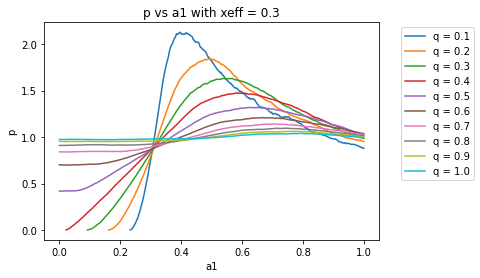

In [10]:
# plot the data
for i in range(len(ls_p)):
    plt.plot(ls_a1[i], ls_p[i], label = f'q = {ls_q[i,0]}')
    plt.legend(bbox_to_anchor=(1.05, 1))
    plt.title('p vs a1 with xeff = 0.3')
    plt.xlabel('a1')
    plt.ylabel('p')

## Define evoluation function

In [15]:
def eva_model(model):
    # evaluate the model
    global test_a1
    global test_p
    scores = model.evaluate([ls_q, ls_a1],ls_p)
    print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
    # plot history
    plt.plot(history.history['accuracy'])
    #plt.plot(history.history['val_accuracy'])
    #plt.legend(['train', 'val'], loc='upper left')
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.show()
    #
    plt.plot(history.history['loss'])
    #plt.plot(history.history['val_loss'])
    #plt.legend(['train', 'val'], loc='upper left')
    plt.xlabel('epoches')
    plt.ylabel('loss')
    plt.title('model loss')
    plt.show()
    #
    test_p_pred = model.predict([ls_q, ls_a1])
    # # test_p_pred = scaler_p.inverse_transform(test_p_pred)
    # # test_p = scaler_p.inverse_transform(test_p)
    # # test_a1 = scaler_a.inverse_transform(test_a1)
    # plt.plot(ls_a1[3],test_p_pred[3],label = 'pred',color = 'red',linestyle='dotted')
    # plt.plot(ls_a1[3],ls_p[3],label = 'true',color = 'blue',linestyle='-')
    # plt.title(f'prediction vs true p_a1 for q = {ls_q[3][0]}, xeff = {0.3}')
    # plt.legend()
    # plt.xlabel('a1')
    # plt.ylabel('p')
    # plt.show()
    # #
    # plt.plot(ls_a1[5],test_p_pred[5],label = 'pred',color = 'red',linestyle='dotted')
    # plt.plot(ls_a1[5],ls_p[5],label = 'true',color = 'blue',linestyle='-')
    # plt.title(f'prediction vs true p_a1 for q = {ls_q[5][0]}, xeff = {0.3}')
    # plt.legend()
    # plt.xlabel('a1')
    # plt.ylabel('p')
    # plt.show()
    plt.figure(dpi=600,facecolor='white')
    for i in range(len(test_p_pred)):
        plt.plot(ls_a1[i],test_p_pred[i],linestyle='dotted', label = f'pred q = {ls_q[i,0]}',alpha = 0.5)
        plt.plot(ls_a1[i],ls_p[i],linestyle='dashed',alpha = 0.5)
        plt.title(f'prediction vs true p_a1 for xeff = {0.3}')
        plt.legend(['predicted','actual'],bbox_to_anchor=(1.05, 1))
        plt.xlabel('a1')
        plt.ylabel('p')
    plt.show()


## Define Model

In [40]:
Input1 = Input(shape=(len(ls_q[0]),))
Input2 = Input(shape=(len(ls_a1[0]),))
merged = keras.layers.concatenate([Input1, Input2]) # 1000 elements
x = keras.layers.Dense(1024, activation='relu')(merged)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dense(512, activation='relu')(x)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
output = keras.layers.Dense(500)(x) 
#
model = Model(inputs=[Input1,Input2], outputs=output)
# opt = keras.optimizers.Adam(learning_rate=3e-2)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
history = model.fit([ls_q, ls_a1],ls_p, epochs=2500,batch_size=8, verbose=2)

Epoch 1/2500
2/2 - 0s - loss: 1.2907 - accuracy: 0.0000e+00 - 325ms/epoch - 163ms/step
Epoch 2/2500
2/2 - 0s - loss: 0.6551 - accuracy: 0.0000e+00 - 11ms/epoch - 6ms/step
Epoch 3/2500
2/2 - 0s - loss: 0.3010 - accuracy: 0.0000e+00 - 12ms/epoch - 6ms/step
Epoch 4/2500
2/2 - 0s - loss: 0.1538 - accuracy: 0.0000e+00 - 13ms/epoch - 7ms/step
Epoch 5/2500
2/2 - 0s - loss: 0.0995 - accuracy: 0.1000 - 12ms/epoch - 6ms/step
Epoch 6/2500
2/2 - 0s - loss: 0.0985 - accuracy: 0.0000e+00 - 13ms/epoch - 7ms/step
Epoch 7/2500
2/2 - 0s - loss: 0.0963 - accuracy: 0.0000e+00 - 12ms/epoch - 6ms/step
Epoch 8/2500
2/2 - 0s - loss: 0.0810 - accuracy: 0.0000e+00 - 11ms/epoch - 5ms/step
Epoch 9/2500
2/2 - 0s - loss: 0.0707 - accuracy: 0.0000e+00 - 13ms/epoch - 6ms/step
Epoch 10/2500
2/2 - 0s - loss: 0.0628 - accuracy: 0.0000e+00 - 9ms/epoch - 4ms/step
Epoch 11/2500
2/2 - 0s - loss: 0.0551 - accuracy: 0.0000e+00 - 11ms/epoch - 6ms/step
Epoch 12/2500
2/2 - 0s - loss: 0.0543 - accuracy: 0.0000e+00 - 14ms/epoch - 

1/1 [==============================] - 0s 24ms/step - loss: 3.8831e-05 - accuracy: 0.3000
accuracy: 30.00%


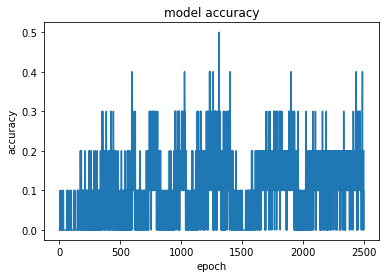

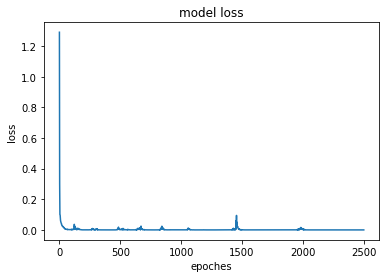

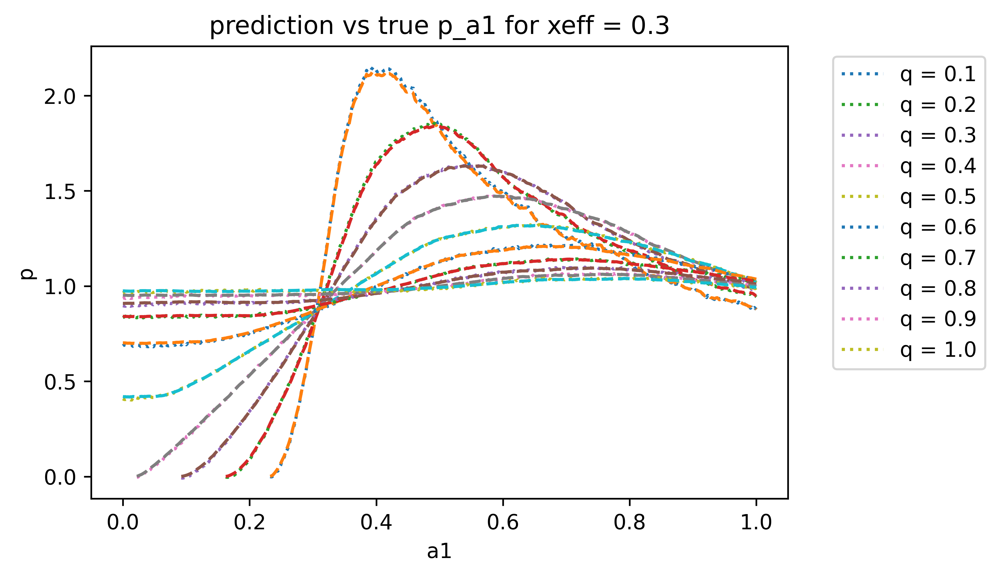

In [61]:
eva_model(model)

Add dropout and batch norm

In [62]:
Input1 = Input(shape=(len(ls_q[0]),))
Input2 = Input(shape=(len(ls_a1[0]),))
merged = keras.layers.concatenate([Input1, Input2]) # 1000 elements
x = keras.layers.Dense(1024, activation='relu')(merged)
x = keras.layers.Dropout(0.2)(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dense(512, activation='relu')(x)
x = keras.layers.Dropout(0.2)(x)
x = keras.layers.BatchNormalization()(x)
output = keras.layers.Dense(500)(x) 
#
model = Model(inputs=[Input1,Input2], outputs=output)
# opt = keras.optimizers.Adam(learning_rate=3e-2)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
history = model.fit([ls_q, ls_a1],ls_p, epochs=2500,batch_size=8, verbose=2)

Epoch 1/2500
2/2 - 1s - loss: 2.2074 - accuracy: 0.0000e+00 - 727ms/epoch - 364ms/step
Epoch 2/2500
2/2 - 0s - loss: 2.1598 - accuracy: 0.0000e+00 - 14ms/epoch - 7ms/step
Epoch 3/2500
2/2 - 0s - loss: 2.0444 - accuracy: 0.0000e+00 - 13ms/epoch - 7ms/step
Epoch 4/2500
2/2 - 0s - loss: 1.9790 - accuracy: 0.0000e+00 - 11ms/epoch - 6ms/step
Epoch 5/2500
2/2 - 0s - loss: 1.9416 - accuracy: 0.0000e+00 - 17ms/epoch - 9ms/step
Epoch 6/2500
2/2 - 0s - loss: 1.8235 - accuracy: 0.0000e+00 - 15ms/epoch - 8ms/step
Epoch 7/2500
2/2 - 0s - loss: 1.8553 - accuracy: 0.0000e+00 - 12ms/epoch - 6ms/step
Epoch 8/2500
2/2 - 0s - loss: 1.8695 - accuracy: 0.0000e+00 - 14ms/epoch - 7ms/step
Epoch 9/2500
2/2 - 0s - loss: 1.7314 - accuracy: 0.0000e+00 - 11ms/epoch - 6ms/step
Epoch 10/2500
2/2 - 0s - loss: 1.7069 - accuracy: 0.0000e+00 - 15ms/epoch - 7ms/step
Epoch 11/2500
2/2 - 0s - loss: 1.6803 - accuracy: 0.0000e+00 - 19ms/epoch - 9ms/step
Epoch 12/2500
2/2 - 0s - loss: 1.6448 - accuracy: 0.0000e+00 - 17ms/epo

1/1 [==============================] - 0s 206ms/step - loss: 0.0530 - accuracy: 0.1000
accuracy: 10.00%


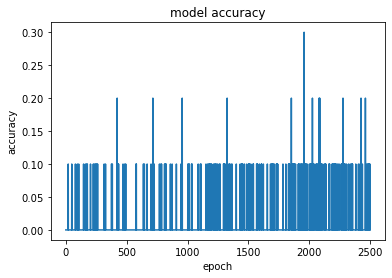

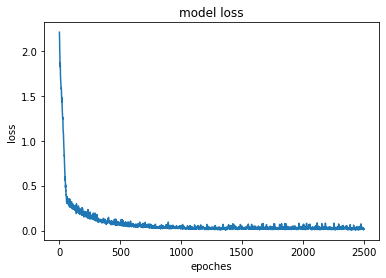

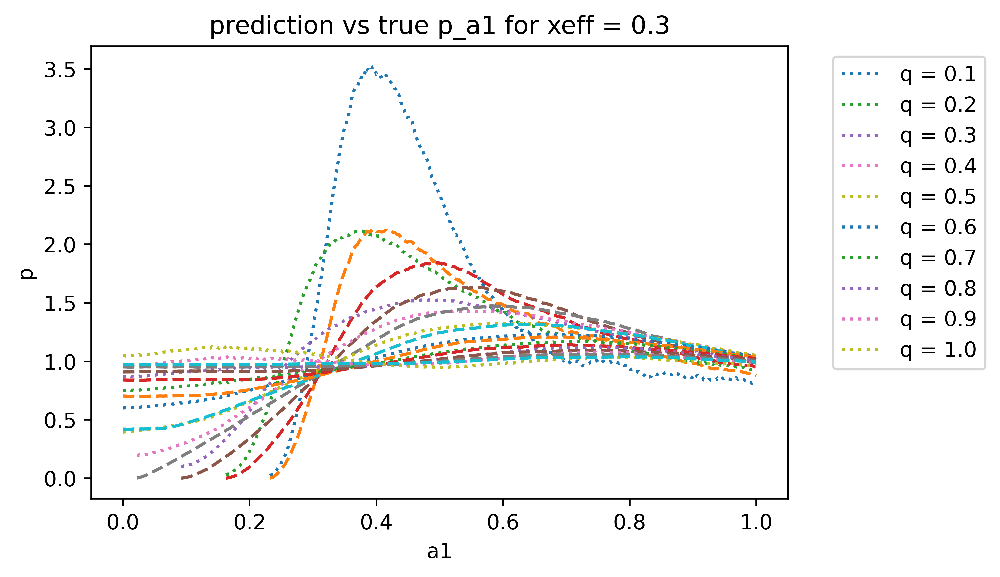

In [63]:
eva_model(model)

It's somehow worse than before..

change the neurons of the first layer to 512

In [64]:
Input1 = Input(shape=(len(ls_q[0]),))
Input2 = Input(shape=(len(ls_a1[0]),))
merged = keras.layers.concatenate([Input1, Input2]) # 1000 elements
x = keras.layers.Dense(512, activation='relu')(merged)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dense(512, activation='relu')(x)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
output = keras.layers.Dense(500)(x) 
#
model = Model(inputs=[Input1,Input2], outputs=output)
# opt = keras.optimizers.Adam(learning_rate=3e-2)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
history = model.fit([ls_q, ls_a1],ls_p, epochs=2500,batch_size=8, verbose=2)

Epoch 1/2500
2/2 - 0s - loss: 1.2620 - accuracy: 0.0000e+00 - 389ms/epoch - 195ms/step
Epoch 2/2500
2/2 - 0s - loss: 0.6382 - accuracy: 0.0000e+00 - 9ms/epoch - 4ms/step
Epoch 3/2500
2/2 - 0s - loss: 0.4624 - accuracy: 0.0000e+00 - 6ms/epoch - 3ms/step
Epoch 4/2500
2/2 - 0s - loss: 0.1866 - accuracy: 0.0000e+00 - 9ms/epoch - 4ms/step
Epoch 5/2500
2/2 - 0s - loss: 0.1460 - accuracy: 0.0000e+00 - 7ms/epoch - 3ms/step
Epoch 6/2500
2/2 - 0s - loss: 0.1161 - accuracy: 0.0000e+00 - 7ms/epoch - 3ms/step
Epoch 7/2500
2/2 - 0s - loss: 0.1047 - accuracy: 0.0000e+00 - 10ms/epoch - 5ms/step
Epoch 8/2500
2/2 - 0s - loss: 0.0948 - accuracy: 0.1000 - 7ms/epoch - 4ms/step
Epoch 9/2500
2/2 - 0s - loss: 0.0846 - accuracy: 0.0000e+00 - 8ms/epoch - 4ms/step
Epoch 10/2500
2/2 - 0s - loss: 0.0760 - accuracy: 0.0000e+00 - 8ms/epoch - 4ms/step
Epoch 11/2500
2/2 - 0s - loss: 0.0668 - accuracy: 0.0000e+00 - 6ms/epoch - 3ms/step
Epoch 12/2500
2/2 - 0s - loss: 0.0589 - accuracy: 0.0000e+00 - 5ms/epoch - 2ms/step


1/1 [==============================] - 0s 159ms/step - loss: 2.3416e-05 - accuracy: 0.1000
accuracy: 10.00%


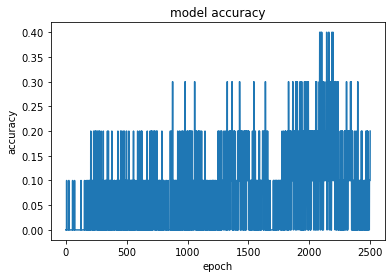

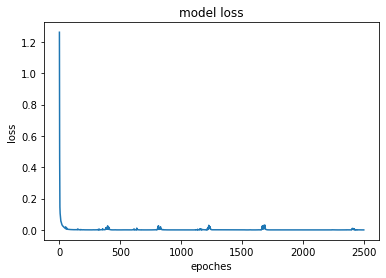

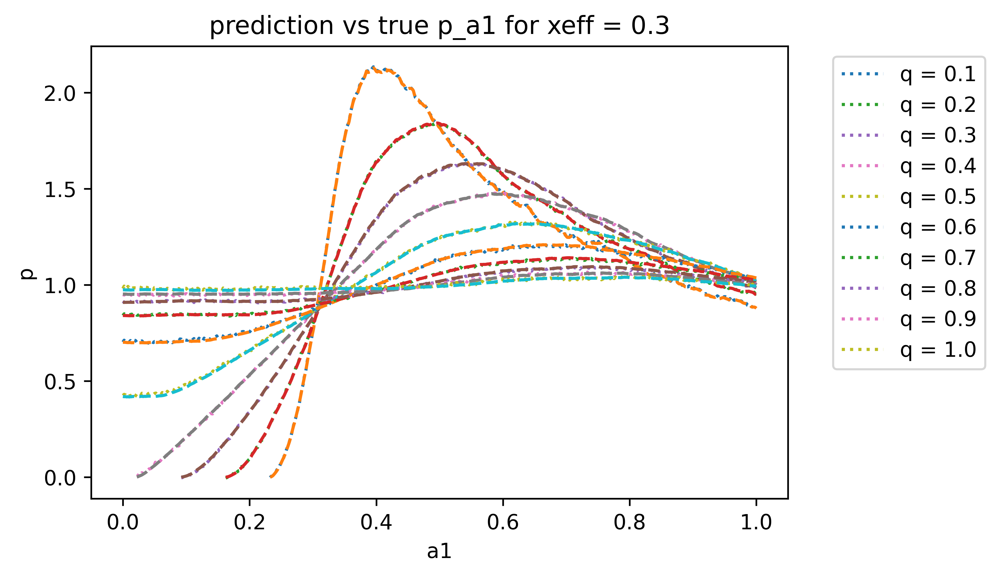

In [65]:
eva_model(model)

In [66]:
Input1 = Input(shape=(len(ls_q[0]),))
Input2 = Input(shape=(len(ls_a1[0]),))
merged = keras.layers.concatenate([Input1, Input2]) # 1000 elements
x = keras.layers.Dense(1024, activation='relu')(merged)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dense(1024, activation='relu')(x)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
output = keras.layers.Dense(500)(x) 
#
model = Model(inputs=[Input1,Input2], outputs=output)
# opt = keras.optimizers.Adam(learning_rate=3e-2)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
history = model.fit([ls_q, ls_a1],ls_p, epochs=2500,batch_size=16, verbose=2)

Epoch 1/2500
1/1 - 0s - loss: 1.3956 - accuracy: 0.0000e+00 - 348ms/epoch - 348ms/step
Epoch 2/2500
1/1 - 0s - loss: 0.6676 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 3/2500
1/1 - 0s - loss: 0.5015 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 4/2500
1/1 - 0s - loss: 0.2363 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 5/2500
1/1 - 0s - loss: 0.1638 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 6/2500
1/1 - 0s - loss: 0.1473 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 7/2500
1/1 - 0s - loss: 0.1261 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 8/2500
1/1 - 0s - loss: 0.1155 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 9/2500
1/1 - 0s - loss: 0.0998 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 10/2500
1/1 - 0s - loss: 0.0961 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 11/2500
1/1 - 0s - loss: 0.0903 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 12/2500
1/1 - 0s - loss: 0.0803 - accuracy: 0.0000e+00 - 12ms/epo

1/1 [==============================] - 0s 122ms/step - loss: 4.0164e-06 - accuracy: 0.4000
accuracy: 40.00%


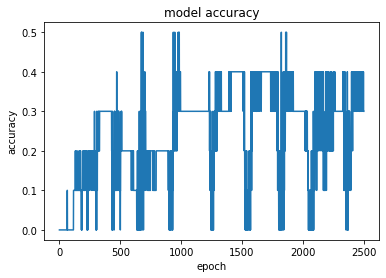

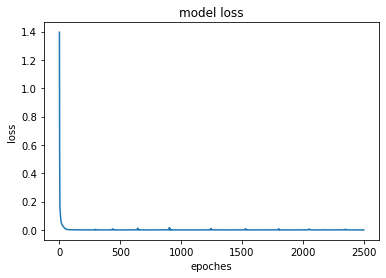

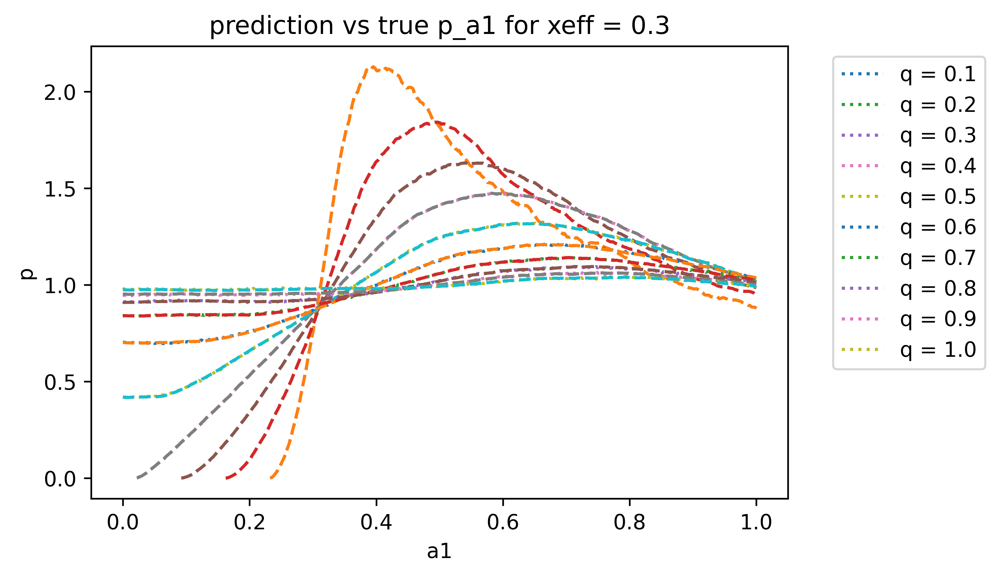

In [67]:
eva_model(model)

add another layer

In [68]:
Input1 = Input(shape=(len(ls_q[0]),))
Input2 = Input(shape=(len(ls_a1[0]),))
merged = keras.layers.concatenate([Input1, Input2]) # 1000 elements
x = keras.layers.Dense(1024, activation='relu')(merged)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dense(1024, activation='relu')(x)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dense(1024, activation='relu')(x)
output = keras.layers.Dense(500)(x) 
#
model = Model(inputs=[Input1,Input2], outputs=output)
# opt = keras.optimizers.Adam(learning_rate=3e-2)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
history = model.fit([ls_q, ls_a1],ls_p, epochs=2500,batch_size=16, verbose=2)

Epoch 1/2500
1/1 - 0s - loss: 1.3109 - accuracy: 0.0000e+00 - 489ms/epoch - 489ms/step
Epoch 2/2500
1/1 - 0s - loss: 0.7371 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 3/2500
1/1 - 0s - loss: 0.7357 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 4/2500
1/1 - 0s - loss: 0.2421 - accuracy: 0.1000 - 11ms/epoch - 11ms/step
Epoch 5/2500
1/1 - 0s - loss: 0.2495 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 6/2500
1/1 - 0s - loss: 0.1830 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 7/2500
1/1 - 0s - loss: 0.1760 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 8/2500
1/1 - 0s - loss: 0.1311 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 9/2500
1/1 - 0s - loss: 0.0956 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 10/2500
1/1 - 0s - loss: 0.1040 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 11/2500
1/1 - 0s - loss: 0.0902 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 12/2500
1/1 - 0s - loss: 0.0936 - accuracy: 0.0000e+00 - 11

1/1 [==============================] - 0s 159ms/step - loss: 3.0892e-06 - accuracy: 0.4000
accuracy: 40.00%


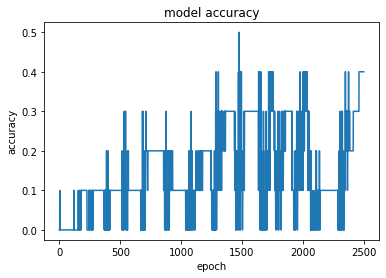

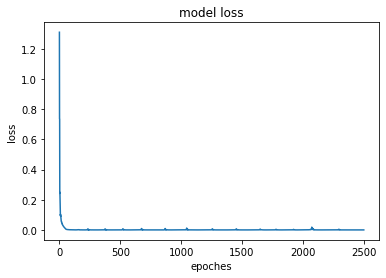

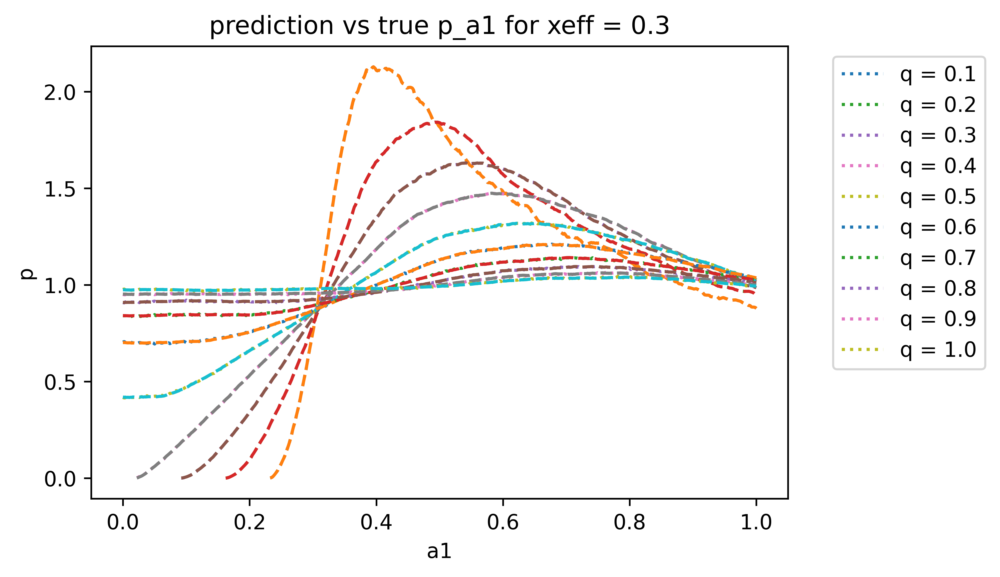

In [69]:
eva_model(model)

2048 neurons in 1st layers

In [70]:
Input1 = Input(shape=(len(ls_q[0]),))
Input2 = Input(shape=(len(ls_a1[0]),))
merged = keras.layers.concatenate([Input1, Input2]) # 1000 elements
x = keras.layers.Dense(2048, activation='relu')(merged)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dense(1024, activation='relu')(x)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
output = keras.layers.Dense(500)(x) 
#
model = Model(inputs=[Input1,Input2], outputs=output)
# opt = keras.optimizers.Adam(learning_rate=3e-2)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
history = model.fit([ls_q, ls_a1],ls_p, epochs=2500,batch_size=16, verbose=2)

Epoch 1/2500
1/1 - 1s - loss: 1.3438 - accuracy: 0.0000e+00 - 506ms/epoch - 506ms/step
Epoch 2/2500
1/1 - 0s - loss: 0.6212 - accuracy: 0.0000e+00 - 19ms/epoch - 19ms/step
Epoch 3/2500
1/1 - 0s - loss: 0.4069 - accuracy: 0.0000e+00 - 15ms/epoch - 15ms/step
Epoch 4/2500
1/1 - 0s - loss: 0.2131 - accuracy: 0.0000e+00 - 17ms/epoch - 17ms/step
Epoch 5/2500
1/1 - 0s - loss: 0.1490 - accuracy: 0.0000e+00 - 15ms/epoch - 15ms/step
Epoch 6/2500
1/1 - 0s - loss: 0.1226 - accuracy: 0.0000e+00 - 17ms/epoch - 17ms/step
Epoch 7/2500
1/1 - 0s - loss: 0.1065 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 8/2500
1/1 - 0s - loss: 0.1072 - accuracy: 0.0000e+00 - 25ms/epoch - 25ms/step
Epoch 9/2500
1/1 - 0s - loss: 0.1061 - accuracy: 0.0000e+00 - 15ms/epoch - 15ms/step
Epoch 10/2500
1/1 - 0s - loss: 0.0972 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 11/2500
1/1 - 0s - loss: 0.0823 - accuracy: 0.1000 - 14ms/epoch - 14ms/step
Epoch 12/2500
1/1 - 0s - loss: 0.0692 - accuracy: 0.1000 - 15ms/e

1/1 [==============================] - 0s 141ms/step - loss: 7.3195e-06 - accuracy: 0.2000
accuracy: 20.00%


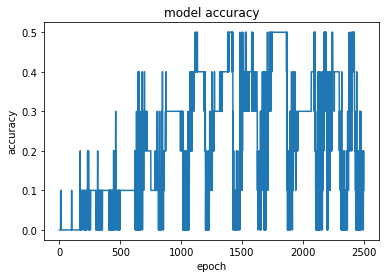

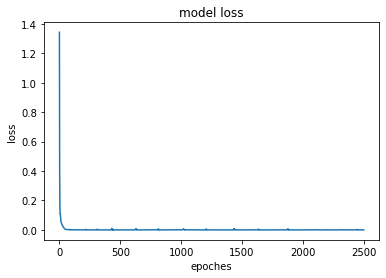

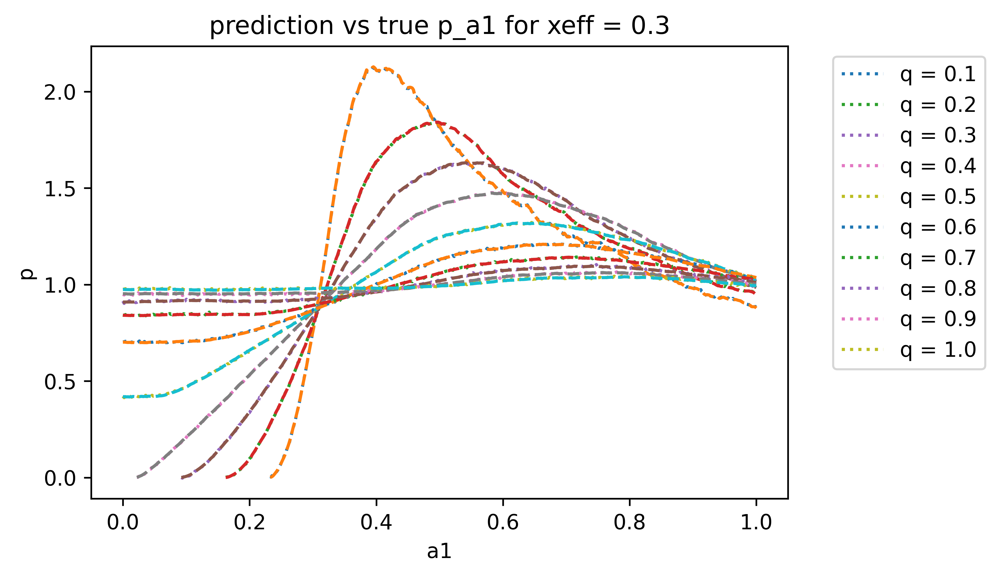

In [71]:
eva_model(model)

In [72]:
Input1 = Input(shape=(len(ls_q[0]),))
Input2 = Input(shape=(len(ls_a1[0]),))
merged = keras.layers.concatenate([Input1, Input2]) # 1000 elements
x = keras.layers.Dense(1024, activation='relu')(merged)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dense(1024, activation='relu')(x)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
output = keras.layers.Dense(500)(x) 
#
model = Model(inputs=[Input1,Input2], outputs=output)
# opt = keras.optimizers.Adam(learning_rate=3e-2)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
history = model.fit([ls_q, ls_a1],ls_p, epochs=5000,batch_size=16, verbose=2)

Epoch 1/5000
1/1 - 0s - loss: 1.3829 - accuracy: 0.0000e+00 - 335ms/epoch - 335ms/step
Epoch 2/5000
1/1 - 0s - loss: 0.6685 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 3/5000
1/1 - 0s - loss: 0.4735 - accuracy: 0.0000e+00 - 7ms/epoch - 7ms/step
Epoch 4/5000
1/1 - 0s - loss: 0.2112 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 5/5000
1/1 - 0s - loss: 0.1474 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 6/5000
1/1 - 0s - loss: 0.1340 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 7/5000
1/1 - 0s - loss: 0.1167 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 8/5000
1/1 - 0s - loss: 0.1091 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 9/5000
1/1 - 0s - loss: 0.0972 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 10/5000
1/1 - 0s - loss: 0.0924 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 11/5000
1/1 - 0s - loss: 0.0812 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 12/5000
1/1 - 0s - loss: 0.0722 - accuracy: 0.0000e+00 - 9ms/epoc

1/1 [==============================] - 0s 209ms/step - loss: 1.2999e-06 - accuracy: 0.6000
accuracy: 60.00%


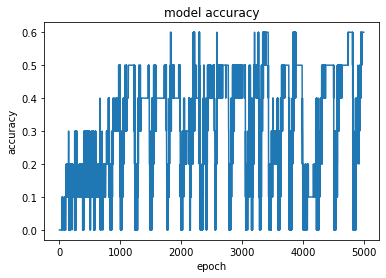

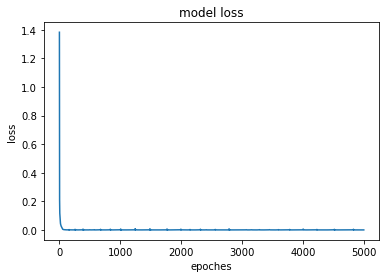

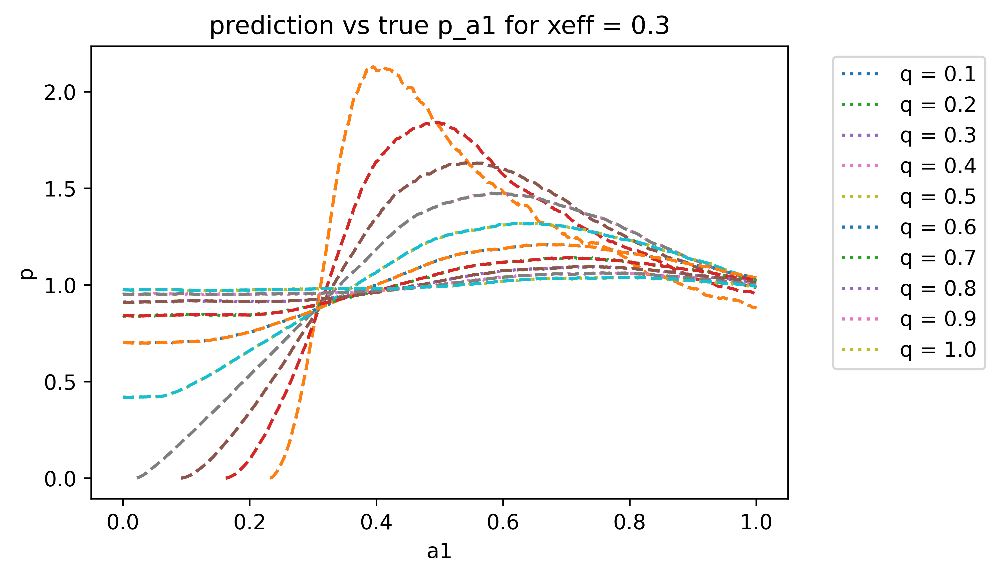

In [73]:
eva_model(model)

## Training

In [12]:
Input1 = Input(shape=(len(ls_q[0]),))
Input2 = Input(shape=(len(ls_a1[0]),))
merged = keras.layers.concatenate([Input1, Input2]) # 1000 elements
x = keras.layers.Dense(1024, activation='relu')(merged)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dense(1024, activation='relu')(x)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
output = keras.layers.Dense(500)(x) 
#
model = Model(inputs=[Input1,Input2], outputs=output)
# opt = keras.optimizers.Adam(learning_rate=3e-2)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
history = model.fit([ls_q, ls_a1],ls_p, epochs=6000,batch_size=10, verbose=2)

Epoch 1/6000
1/1 - 0s - loss: 1.3591 - accuracy: 0.0000e+00 - 420ms/epoch - 420ms/step
Epoch 2/6000
1/1 - 0s - loss: 0.7067 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 3/6000
1/1 - 0s - loss: 0.4889 - accuracy: 0.0000e+00 - 7ms/epoch - 7ms/step
Epoch 4/6000
1/1 - 0s - loss: 0.2301 - accuracy: 0.0000e+00 - 15ms/epoch - 15ms/step
Epoch 5/6000
1/1 - 0s - loss: 0.1447 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 6/6000
1/1 - 0s - loss: 0.1294 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 7/6000
1/1 - 0s - loss: 0.1183 - accuracy: 0.0000e+00 - 16ms/epoch - 16ms/step
Epoch 8/6000
1/1 - 0s - loss: 0.1122 - accuracy: 0.0000e+00 - 16ms/epoch - 16ms/step
Epoch 9/6000
1/1 - 0s - loss: 0.1014 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 10/6000
1/1 - 0s - loss: 0.0972 - accuracy: 0.0000e+00 - 6ms/epoch - 6ms/step
Epoch 11/6000
1/1 - 0s - loss: 0.0863 - accuracy: 0.0000e+00 - 7ms/epoch - 7ms/step
Epoch 12/6000
1/1 - 0s - loss: 0.0761 - accuracy: 0.0000e+00 - 8ms/epoc

1/1 [==============================] - 0s 37ms/step - loss: 7.1082e-07 - accuracy: 0.5000
accuracy: 50.00%


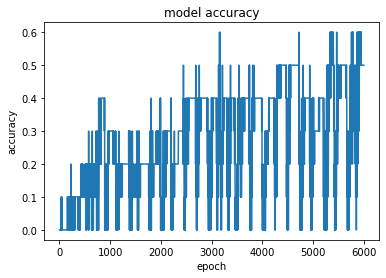

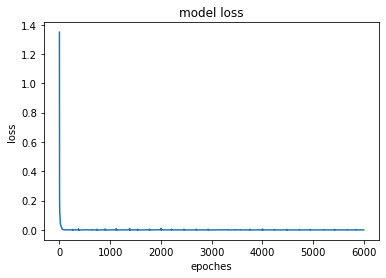

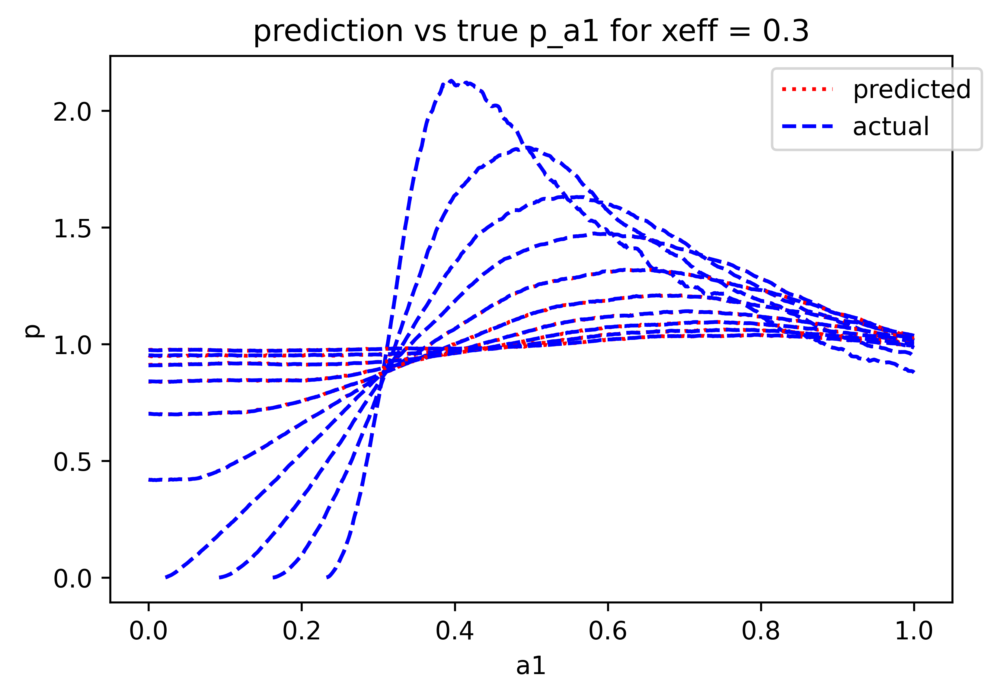

In [22]:
eva_model(model)

In [14]:
Input1 = Input(shape=(len(ls_q[0]),))
Input2 = Input(shape=(len(ls_a1[0]),))
merged = keras.layers.concatenate([Input1, Input2]) # 1000 elements
x = keras.layers.Dense(1024, activation='relu')(merged)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dense(1024, activation='relu')(x)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
output = keras.layers.Dense(500)(x) 
#
model = Model(inputs=[Input1,Input2], outputs=output)
# opt = keras.optimizers.Adam(learning_rate=3e-2)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
history = model.fit([ls_q, ls_a1],ls_p, epochs=6000,batch_size=16, verbose=2)

Epoch 1/6000
1/1 - 0s - loss: 1.3485 - accuracy: 0.0000e+00 - 309ms/epoch - 309ms/step
Epoch 2/6000
1/1 - 0s - loss: 0.6843 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 3/6000
1/1 - 0s - loss: 0.4792 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 4/6000
1/1 - 0s - loss: 0.2275 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 5/6000
1/1 - 0s - loss: 0.1484 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 6/6000
1/1 - 0s - loss: 0.1420 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 7/6000
1/1 - 0s - loss: 0.1222 - accuracy: 0.0000e+00 - 16ms/epoch - 16ms/step
Epoch 8/6000
1/1 - 0s - loss: 0.1151 - accuracy: 0.0000e+00 - 15ms/epoch - 15ms/step
Epoch 9/6000
1/1 - 0s - loss: 0.1022 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 10/6000
1/1 - 0s - loss: 0.0973 - accuracy: 0.0000e+00 - 7ms/epoch - 7ms/step
Epoch 11/6000
1/1 - 0s - loss: 0.0902 - accuracy: 0.0000e+00 - 7ms/epoch - 7ms/step
Epoch 12/6000
1/1 - 0s - loss: 0.0781 - accuracy: 0.0000e+00 - 7ms/ep

1/1 [==============================] - 0s 23ms/step - loss: 7.1082e-07 - accuracy: 0.5000
accuracy: 50.00%


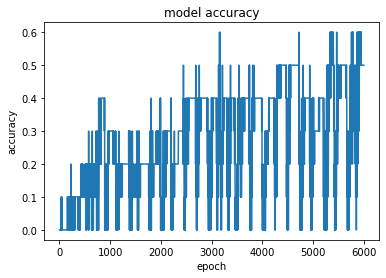

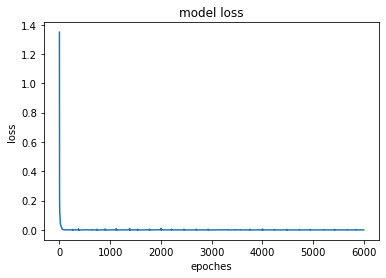

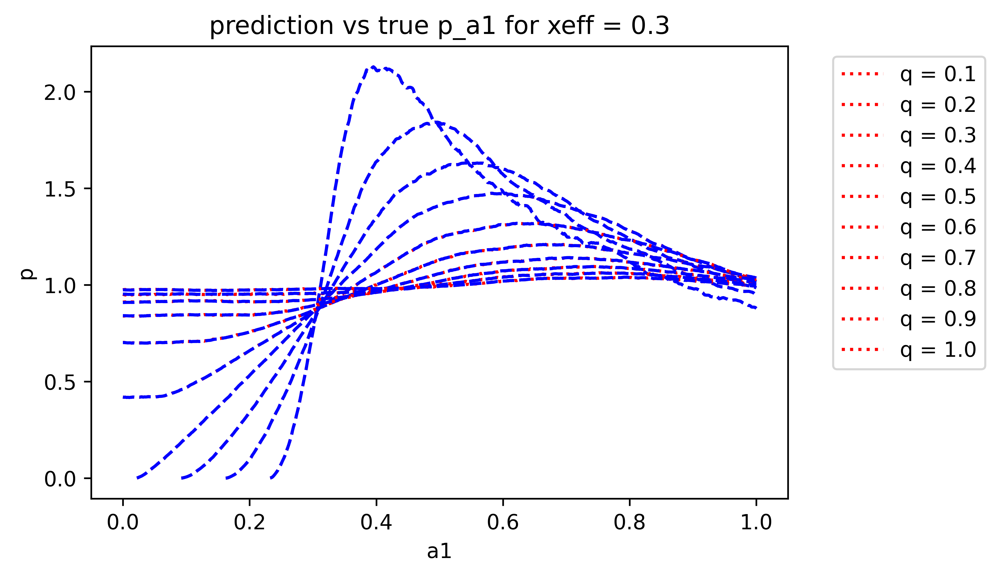

In [18]:
eva_model(model)

In [25]:
Input1 = Input(shape=(len(ls_q[0]),))
Input2 = Input(shape=(len(ls_a1[0]),))
merged = keras.layers.concatenate([Input1, Input2]) # 1000 elements
x = keras.layers.Dense(1024, activation='relu')(merged)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dense(1024, activation='relu')(x)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
output = keras.layers.Dense(500)(x) 
#
model = Model(inputs=[Input1,Input2], outputs=output)
# opt = keras.optimizers.Adam(learning_rate=3e-2)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
history = model.fit([ls_q, ls_a1],ls_p, epochs=6000,batch_size=32, verbose=2)

Epoch 1/6000
1/1 - 0s - loss: 1.3270 - accuracy: 0.0000e+00 - 358ms/epoch - 358ms/step
Epoch 2/6000
1/1 - 0s - loss: 0.7074 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 3/6000
1/1 - 0s - loss: 0.4834 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 4/6000
1/1 - 0s - loss: 0.2592 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 5/6000
1/1 - 0s - loss: 0.1600 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 6/6000
1/1 - 0s - loss: 0.1391 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 7/6000
1/1 - 0s - loss: 0.1151 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 8/6000
1/1 - 0s - loss: 0.1090 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 9/6000
1/1 - 0s - loss: 0.0974 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 10/6000
1/1 - 0s - loss: 0.0944 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 11/6000
1/1 - 0s - loss: 0.0867 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 12/6000
1/1 - 0s - loss: 0.0758 - accuracy: 0.0000e+00 - 12ms/epoch

1/1 [==============================] - 0s 19ms/step - loss: 5.4853e-06 - accuracy: 0.1000
accuracy: 10.00%


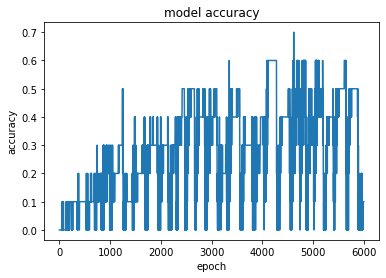

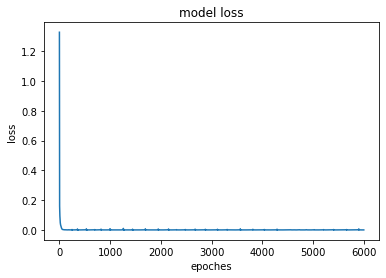

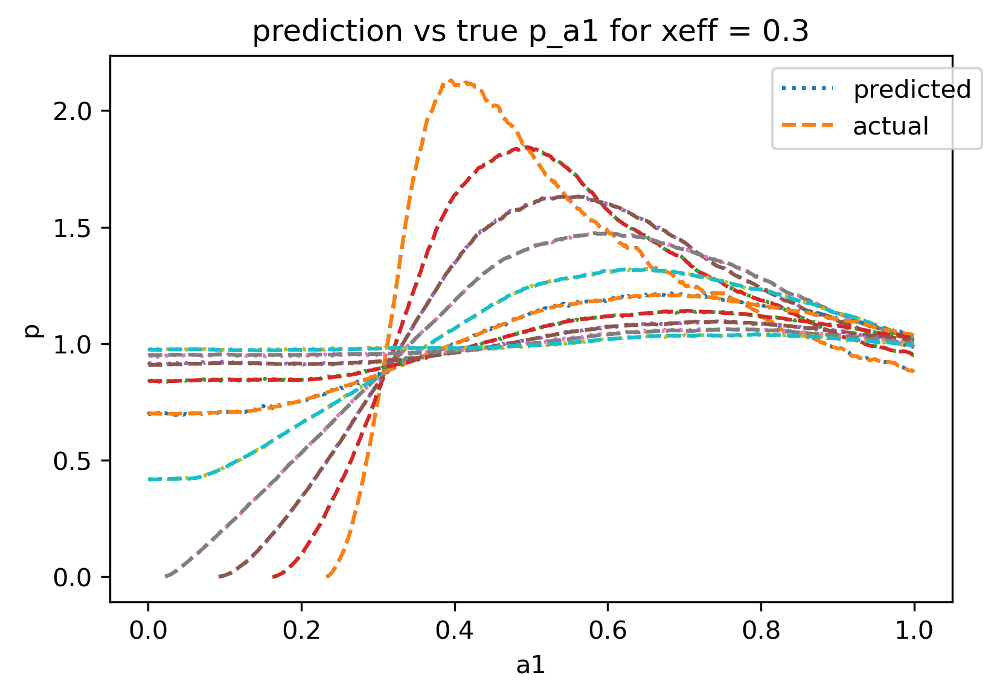

In [28]:
eva_model(model)

In [12]:
Input1 = Input(shape=(len(ls_q[0]),))
Input2 = Input(shape=(len(ls_a1[0]),))
merged = keras.layers.concatenate([Input1, Input2]) # 1000 elements
x = keras.layers.Dense(1024, activation='relu')(merged)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dense(1024, activation='relu')(x)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
output = keras.layers.Dense(500)(x) 
#
# callback = keras.callbacks.EarlyStopping(monitor='accuracy', patience=200)
model = Model(inputs=[Input1,Input2], outputs=output)
# opt = keras.optimizers.Adam(learning_rate=3e-2)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
history = model.fit([ls_q, ls_a1],ls_p, epochs=5000,batch_size=32, verbose=2)

Epoch 1/5000
1/1 - 0s - loss: 1.3264 - accuracy: 0.0000e+00 - 338ms/epoch - 338ms/step
Epoch 2/5000
1/1 - 0s - loss: 0.6917 - accuracy: 0.0000e+00 - 7ms/epoch - 7ms/step
Epoch 3/5000
1/1 - 0s - loss: 0.5026 - accuracy: 0.0000e+00 - 7ms/epoch - 7ms/step
Epoch 4/5000
1/1 - 0s - loss: 0.2458 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 5/5000
1/1 - 0s - loss: 0.1604 - accuracy: 0.0000e+00 - 7ms/epoch - 7ms/step
Epoch 6/5000
1/1 - 0s - loss: 0.1455 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 7/5000
1/1 - 0s - loss: 0.1238 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 8/5000
1/1 - 0s - loss: 0.1078 - accuracy: 0.0000e+00 - 21ms/epoch - 21ms/step
Epoch 9/5000
1/1 - 0s - loss: 0.0939 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 10/5000
1/1 - 0s - loss: 0.0893 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 11/5000
1/1 - 0s - loss: 0.0845 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 12/5000
1/1 - 0s - loss: 0.0768 - accuracy: 0.0000e+00 - 9ms/epoch 

1/1 [==============================] - 0s 47ms/step - loss: 9.3607e-07 - accuracy: 0.5000
accuracy: 50.00%


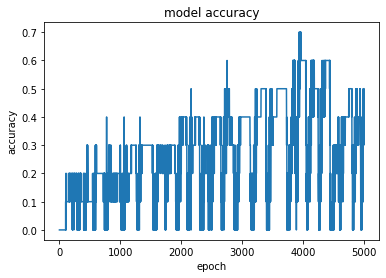

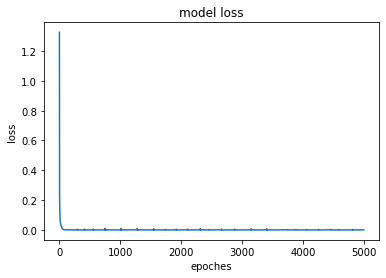

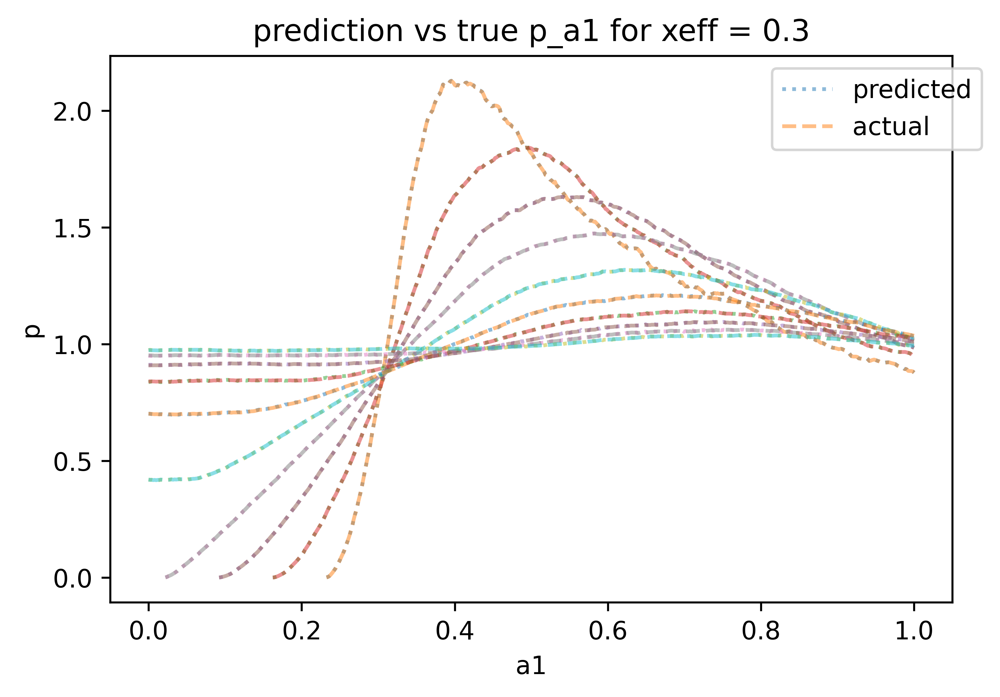

In [16]:
eva_model(model)

In [17]:
Input1 = Input(shape=(len(ls_q[0]),))
Input2 = Input(shape=(len(ls_a1[0]),))
merged = keras.layers.concatenate([Input1, Input2]) # 1000 elements
x = keras.layers.Dense(1024, activation='relu')(merged)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dense(1024, activation='relu')(x)
# x = keras.layers.Dropout(0.2)(x)
# x = keras.layers.BatchNormalization()(x)
output = keras.layers.Dense(500)(x) 
#
# callback = keras.callbacks.EarlyStopping(monitor='accuracy', patience=200)
model = Model(inputs=[Input1,Input2], outputs=output)
# opt = keras.optimizers.Adam(learning_rate=3e-2)
model.compile(optimizer='sgd', loss='mse', metrics=['accuracy'])
history = model.fit([ls_q, ls_a1],ls_p, epochs=10000,batch_size=32, verbose=2)

Epoch 1/5000
1/1 - 0s - loss: 1.3367 - accuracy: 0.0000e+00 - 321ms/epoch - 321ms/step
Epoch 2/5000
1/1 - 0s - loss: 1.3084 - accuracy: 0.0000e+00 - 7ms/epoch - 7ms/step
Epoch 3/5000
1/1 - 0s - loss: 1.2816 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 4/5000
1/1 - 0s - loss: 1.2562 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 5/5000
1/1 - 0s - loss: 1.2321 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 6/5000
1/1 - 0s - loss: 1.2092 - accuracy: 0.0000e+00 - 7ms/epoch - 7ms/step
Epoch 7/5000
1/1 - 0s - loss: 1.1872 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 8/5000
1/1 - 0s - loss: 1.1663 - accuracy: 0.0000e+00 - 21ms/epoch - 21ms/step
Epoch 9/5000
1/1 - 0s - loss: 1.1462 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 10/5000
1/1 - 0s - loss: 1.1270 - accuracy: 0.0000e+00 - 15ms/epoch - 15ms/step
Epoch 11/5000
1/1 - 0s - loss: 1.1086 - accuracy: 0.0000e+00 - 17ms/epoch - 17ms/step
Epoch 12/5000
1/1 - 0s - loss: 1.0908 - accuracy: 0.0000e+00 - 9ms/epoc

KeyboardInterrupt: 